# Single cell ATAC-Seq analysis data by 10x Cell Ranger


_Cell Ranger ATAC-Seq_ https://support.10xgenomics.com/single-cell-atac/software/pipelines/latest/algorithms/overview

Information about library.

<img src='assets/1.png' width=80%>

In [1]:
%matplotlib inline
%config InlineBackend.figure_format ='retina'
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("whitegrid")

# Fragments file processing

In [2]:
import re

# Fragments file provided by cell ranger
fragments_file_gz = '/mnt/stripe/shpynov/2019_sc_ATAC_seq_gxfer1_39174753087306/atac/TWDB-T-CIML007-Baseline_NK_snATAC/outs/fragments.tsv.gz'

# BedTools doesn't work with gz file, so unzip it
!gunzip {fragments_file_gz}
fragments_file = re.sub('\.gz', '', fragments_file_gz)

# Print first line of fragments file
with open(fragments_file, 'r') as fin:        
    for line in fin:        
        print(line)
        break

gzip: /mnt/stripe/shpynov/2019_sc_ATAC_seq_gxfer1_39174753087306/atac/TWDB-T-CIML007-Baseline_NK_snATAC/outs/fragments.tsv.gz: No such file or directory
chr1	10073	10369	AGTCCGGGTCAACTGT-1	1



# Cell Calling

_Cell Ranger ATAC-Seq_

Given `peaks.bed` graphics of BARCODE overlaps with peaks.
<img src='assets/2.png' width=50%>

For each barcode, we have the record of mapped high-quality fragments that passed all filters (the fragments.tsv file). Having determined peaks prior to this, we use the number of fragments that overlap any peak regions, for each barcode, to separate the signal from noise. **This works better in practice as compared to naively using the number of fragments per barcode.** We first subtract a depth-dependent fixed count from all barcode counts to model whitelist contamination. This fixed count is the estimated number of fragments per barcode that originated from a different GEM, assuming a contamination rate of 0.02. Then we fit a mixture model of two negative binomial distributions to capture the signal and noise. Setting an odds ratio of 1000, we separate the barcodes that correspond to real cells from the non-cell barcodes.

**We use dumb threshold for now.**

In [3]:
# Intersect using bedtools rather than pybedtools, because they are too slow!
import tempfile
import pandas as pd
import numpy as np
import os

def process_peaks_file(fragments_file, peaks_file, threshold=137):
    ! wc -l {peaks_file}
    idf = None
    ! wc -l {fragments_file}
    with tempfile.NamedTemporaryFile(prefix='intersection', suffix='.bed') as f:
        print('Computing intersection')
        ! bedtools intersect -wa -wb -a {fragments_file} -b {peaks_file} > {f.name}
        ! wc -l {f.name}
        idf = pd.read_csv(f.name, sep='\t', header=None)
        idf.columns = ['chr', 'start', 'end', 'barcode', 'reads', 'peak_chr', 'peak_start', 'peak_end']
    print('Intersection of fragments and peaks')
    print(idf.head())
    pidf = pd.pivot_table(idf, values='reads', index=['barcode'], aggfunc='count')
    pidf.reset_index(level=0, inplace=True)
    print('Barcode vs number of fragments overlapping peaks')
    print(pidf.head())
    
    counts = sorted(pidf['reads'], reverse=True)
    ns = range(1, len(counts) + 1)
    df_all = pd.DataFrame(data={'count': counts, 'n': ns})
    df_cells = df_all.loc[df_all['count'] >= threshold]
    df_noise = df_all.loc[df_all['count'] < threshold]
    print('Filtering cells by threshold', threshold)
    cells = set(pidf.loc[pidf['reads'] >= threshold]['barcode'])
    idfcells = idf.loc[[c in cells for c in idf['barcode']]]
    print('Estimated number of cells', len(df_cells))

    # create a new plot (with a title) using figure
    plt.figure(figsize=(8, 8))
    plt.plot(np.log10(df_cells['n']), np.log10(df_cells['count']), label='Cell', linewidth=3, color='orange')
    plt.plot(np.log10(df_noise['n']), np.log10(df_noise['count']), label='Noise', linewidth=3, color='blue')
    plt.xlabel('Barcodes')
    plt.ylabel('Fragments overlapping Peaks')
    plt.show()
    
    return idfcells

In [4]:
# # 10x Cell ranger single cell ATAC-Seq
# idf10x = process_peaks_file(
#     fragments_file, '/mnt/stripe/shpynov/2019_sc_ATAC_seq_gxfer1_39174753087306/bam/peaks.bed',
#     threshold=3000)

In [5]:
# # MACS2 processing like in scatac pipeline ATAC-Seq
# MACS2 --no-model --p 1e-4
# idfmacs = process_peaks_file(
#     fragments_file, '/mnt/stripe/shpynov/2019_sc_ATAC_seq_gxfer1_39174753087306/bam/macs2_p1e-4.narrowPeak',
#     threshold=20000)

105701 /mnt/stripe/shpynov/2019_sc_ATAC_seq_gxfer1_39174753087306/bam/span_f0_kd_bin100_fdr1.0E-6_gap5.bed
77486512 /mnt/stripe/shpynov/2019_sc_ATAC_seq_gxfer1_39174753087306/atac/TWDB-T-CIML007-Baseline_NK_snATAC/outs/fragments.tsv
Computing intersection
59226768 /tmp/intersectiona0fwi5iu.bed
Intersection of fragments and peaks
    chr  start    end             barcode  reads peak_chr  peak_start  \
0  chr1  10073  10369  AGTCCGGGTCAACTGT-1      1     chr1       10000   
1  chr1  10079  10437  CTTGCTGGTTGCAGCC-1      1     chr1       10000   
2  chr1  10085  10285  CCCTGATTCTTCATAC-1      8     chr1       10000   
3  chr1  10085  10309  TACCTATGTAAGTCTC-1      1     chr1       10000   
4  chr1  10085  10345  CCTAAAGAGCTCGTTA-1      1     chr1       10000   

   peak_end  
0     10700  
1     10700  
2     10700  
3     10700  
4     10700  
Barcode vs number of fragments overlapping peaks
              barcode  reads
0  AAACGAAAGAAACGCC-1      2
1  AAACGAAAGAAAGCAG-1      3
2  AAACGAA

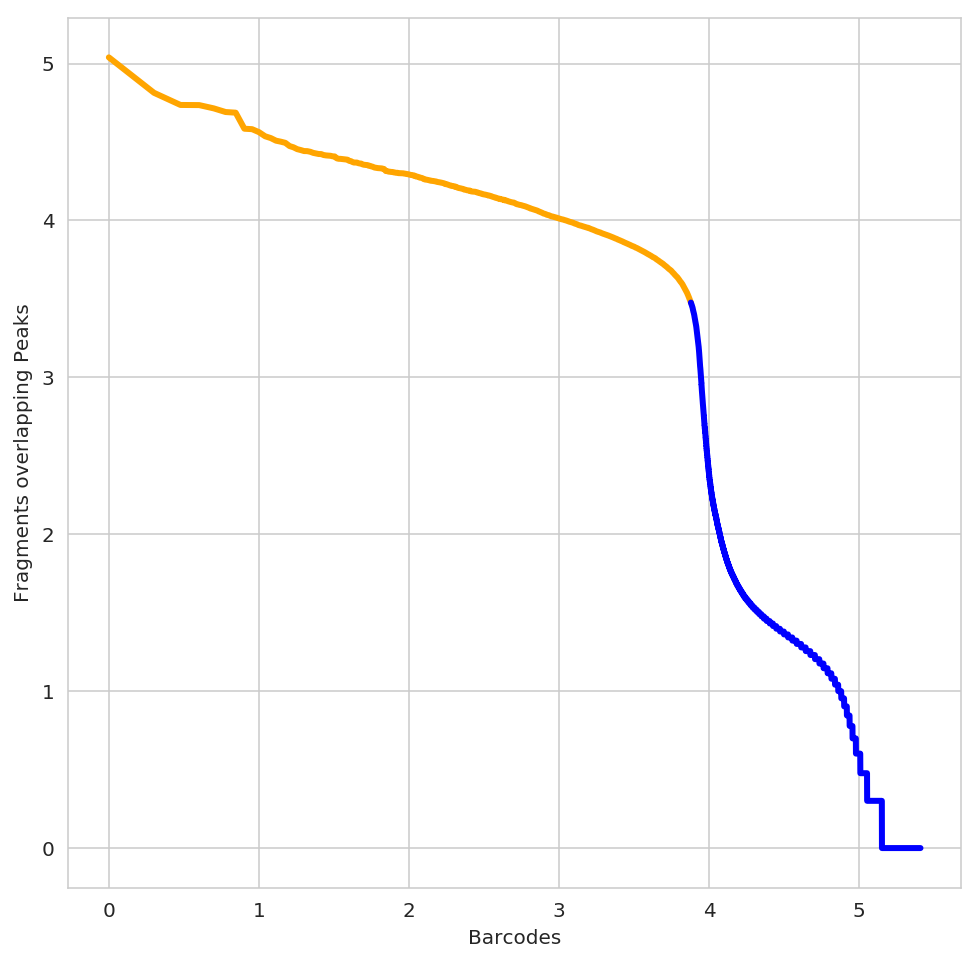

In [6]:
# SPAN - --fragment 0 --keep-dup --bin 100
idfspan = process_peaks_file(
    fragments_file, 
    '/mnt/stripe/shpynov/2019_sc_ATAC_seq_gxfer1_39174753087306/bam/span_f0_kd_bin100_fdr1.0E-6_gap5.bed',
    threshold=3000)

# Peak-Barcode Matrix

_Cell Ranger ATAC-Seq_

We produce a count matrix consisting of the counts of fragment ends (or cut sites) within each peak region for each barcode. This is the raw peak-barcode matrix and it captures the enrichment of open chromatin per barcode. The matrix is then filtered to consist of only cell barcodes, which is then used in subsequent analysis such as dimensionality reduction, clustering and visualization.

In [7]:
idf = idfspan

pdf = pd.pivot_table(idf, values='reads', 
                     index=['peak_chr', 'peak_start', 'peak_end', 'barcode'], aggfunc=np.sum).reset_index()
pdf['peak'] = pdf['peak_chr'] + ':' + pdf['peak_start'].astype(str) + '-' + pdf['peak_end'].astype(str)
pdf.drop(columns=['peak_chr', 'peak_start', 'peak_end'], inplace=True)
print('Barcode vs summary fragments overlap with peaks')
pdf.head()

Barcode vs summary fragments overlap with peaks


,barcode,reads,peak
0,ACTTCCGTCTCTGCGT-1,1,chr1:10000-10700
1,CCCTGATTCTTCATAC-1,8,chr1:10000-10700
2,CCTAAAGAGCTCGTTA-1,1,chr1:10000-10700
3,CGTAAACCACCCTTAC-1,3,chr1:10000-10700
4,CTGCGTTTCGGAGTTT-1,1,chr1:10000-10700


In [8]:
fulldf = pd.pivot_table(pdf, index='peak', columns='barcode', values='reads').fillna(0)
# Remove extra labels from pivot_table columns
fulldf.columns = fulldf.columns.values
fulldf.index.name = None
fulldf.head()

,AAACGAAAGACTAATG-1,AAACGAAAGAGGTGGG-1,AAACGAAAGGGCTTCC-1,AAACGAAAGTATGGGC-1,AAACGAAAGTGTTCCA-1,AAACGAAAGTTCGCGC-1,AAACGAACAATAGTGA-1,AAACGAACACATATCG-1,AAACGAACACGCGTTG-1,AAACGAACATCCATAG-1,...,TTTGTGTAGCATGATA-1,TTTGTGTCAAGTCTCA-1,TTTGTGTCACAACGGA-1,TTTGTGTGTACCTATG-1,TTTGTGTGTGATGCGA-1,TTTGTGTGTGCCCAGT-1,TTTGTGTGTTTGATCG-1,TTTGTGTTCATCGCCT-1,TTTGTGTTCGCTATAG-1,TTTGTGTTCTCGTAGA-1
chr10:100006200-100006800,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
chr10:100009100-100010600,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,14.0,0.0,0.0,0.0,6.0,1.0,0.0
chr10:100020300-100021000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
chr10:100046000-100046500,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
chr10:100148700-100148900,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [10]:
# from functools import lru_cache
# Unfortunately cannot use caching here, because DataFrame is mutable
# @lru_cache(maxsize=3)
def norm(df):
    print('normalize the data to "mean" cut site counts per barcode') 
    t = df / df.mean()
    print('log transform') 
    t = np.log1p(t)
    return t

normdf = norm(fulldf)
normdf.head()

normalize the data to "mean" cut site counts per barcode
log transform


,AAACGAAAGACTAATG-1,AAACGAAAGAGGTGGG-1,AAACGAAAGGGCTTCC-1,AAACGAAAGTATGGGC-1,AAACGAAAGTGTTCCA-1,AAACGAAAGTTCGCGC-1,AAACGAACAATAGTGA-1,AAACGAACACATATCG-1,AAACGAACACGCGTTG-1,AAACGAACATCCATAG-1,...,TTTGTGTAGCATGATA-1,TTTGTGTCAAGTCTCA-1,TTTGTGTCACAACGGA-1,TTTGTGTGTACCTATG-1,TTTGTGTGTGATGCGA-1,TTTGTGTGTGCCCAGT-1,TTTGTGTGTTTGATCG-1,TTTGTGTTCATCGCCT-1,TTTGTGTTCGCTATAG-1,TTTGTGTTCTCGTAGA-1
chr10:100006200-100006800,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,1.964684,0.0,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.00000,0.000000,0.0
chr10:100009100-100010600,0.0,0.0,0.0,0.0,2.563423,2.664413,0.000000,0.000000,0.0,1.818622,...,0.0,0.0,0.0,4.334842,0.0,0.0,0.0,3.76681,2.773847,0.0
chr10:100020300-100021000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.00000,0.000000,0.0
chr10:100046000-100046500,0.0,0.0,0.0,0.0,0.000000,0.000000,2.652319,0.000000,0.0,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.00000,0.000000,0.0
chr10:100148700-100148900,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.00000,0.000000,0.0


# Dimensionality Reduction, Clustering and t-SNE Projection

_Cell Ranger ATAC-Seq_

<img src='assets/3.png' width=50%>

The adopted default method is LSA.

**PCA**

For PCA, we first normalize the data to median cut site counts per barcode and log-transform it. We use a fast, scalable and memory efficient implementation of IRLBA (Augmented, Implicitly Restarted Lanczos Bidiagonalization Algorithm) that allows in-place centering and feature scaling and produces the transformed matrix along with the principal components (PC) and singular values encoding the variance explained by each PC. 
Specific to PCA, we provide k-means clustering that produces 2 to 10 clusters for visualization and analysis. We also provide a k-nearest neighbors graph-based clustering method via community detection using louvain modularity optimization algorithm. 

**LSA**

Inspired by the large body of work in the field of information retrieval, we normalize the data via the inverse-document frequency (idf) transform where each peak count is scaled by the log of the ratio of the number of barcodes in the matrix and the number of barcodes where the peak has a non-zero count. This provides greater weight to counts in peaks that occur in fewer barcodes. LSA aka SVD.
Singular value decomposition (SVD) is performed on this normalized matrix using IRLBA without scaling or centering, and produce the transformed matrix in lower dimensional space, as well as the components and the singular values signifying the importance of each component. Prior to clustering, we perform normalization to depth by scaling each barcode data point to unit L2-norm in the lower dimensional space. We found that the combination of these normalization techniques obviates the need to remove the first component. Specific to LSA, we provide k-medoids clustering that produces 2 to 10 clusters for downstream analysis. k-medoids was found to perform better than k-means on identifying correct clusters on the spherical manifold which is where the data lives after normalizing to unit norm. Similar to PCA, we also provide a graph-based clustering and visualization via t-SNE. However, similar to k-medoids clustering, we normalize the data to unit norm before performing graph-based clustering and t-SNE projection.

**t-SNE**

The transformed matrix is operated on by the t-SNE algorithm with default parameters and provides 2-D coordinates for each barcode for visualization. We also provide an optimized implementation of the Barnes Hut TSNE algorithm (which is the same as the one in our analysis pipeline for the Single Cell Gene Expression Solution). The number of dimensions is fixed to 15 as it was found to sufficiently separate clusters visually and in a biologically meaningful way when tested on peripheral blood mononuclear cells (PBMCs).



## Identification of highly variable features (feature selection)

_Seurat single cell pipeline_ https://satijalab.org/seurat/v3.0/pbmc3k_tutorial.html

We next calculate a subset of features that exhibit high cell-to-cell variation in the dataset (i.e, they are highly expressed in some cells, and lowly expressed in others). We and others have found that focusing on these genes in downstream analysis helps to highlight biological signal in single-cell datasets.

<img src='assets/4.png' width=20%>

normalize the data to "mean" cut site counts per barcode
log transform
Filtration of peaks with mean > 0.2
Filtration of peaks with sd > 0.5
Total peaks 105126
Filtered peaks 17970


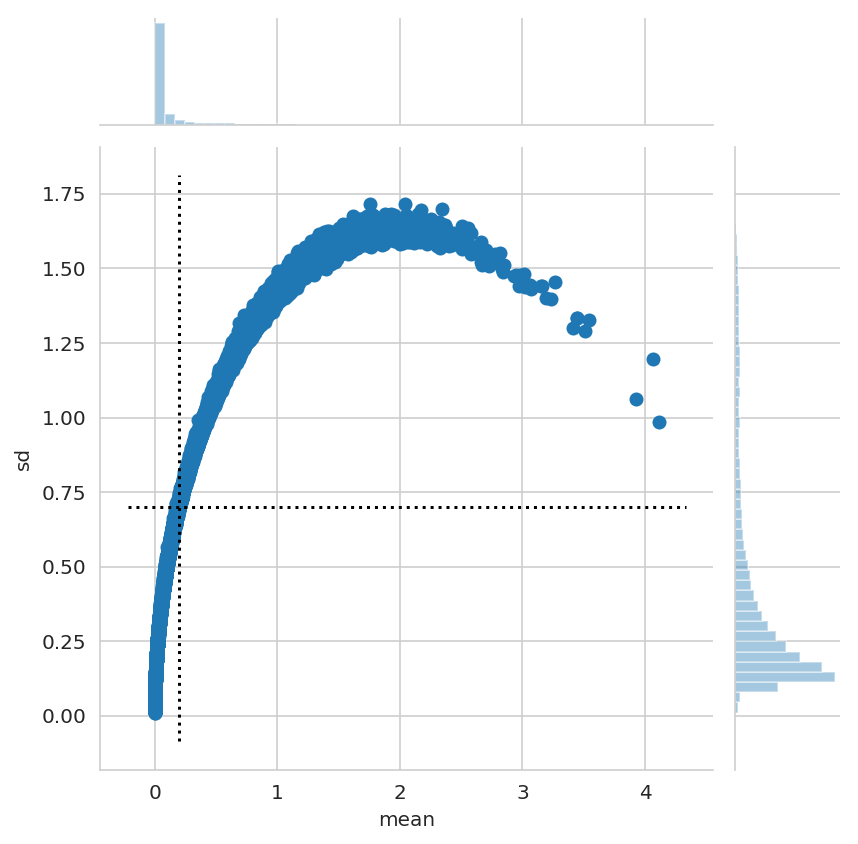

In [11]:
def feature_selection(df, mean_threshold=None, sd_threshold=None):
    """Mean vs SD for peaks"""
    t = norm(df).transpose() # Transpose to (barcodes x peaks)
    msdf = pd.DataFrame({'mean': t.mean(), 'sd': np.sqrt(t.var())})
    if not mean_threshold and not sd_threshold:
        raise Exception('At least single threshold should be given')
    peaks_filter = [True for _ in range(len(msdf))]
    if mean_threshold:
        print('Filtration of peaks with mean >', mean_threshold)
        peaks_filter = np.logical_and(peaks_filter, msdf['mean'] >= mean_threshold)
    if sd_threshold:
        print('Filtration of peaks with sd >', sd_threshold)        
        peaks_filter = np.logical_and(peaks_filter, msdf['sd'] >= sd_threshold)        

    print('Total peaks', len(msdf))
    print('Filtered peaks', sum(peaks_filter))

    min_mean = msdf.loc[peaks_filter]['mean'].min()
    min_sd = msdf.loc[peaks_filter]['sd'].min()

    plt.figure(figsize=(8, 8))
    g = sns.jointplot(x="mean", y="sd", data=msdf)
    x0, x1 = g.ax_joint.get_xlim()
    y0, y1 = g.ax_joint.get_ylim()
    g.ax_joint.plot([min_mean, min_mean], [y0, y1], ':k')   
    g.ax_joint.plot([x0, x1], [min_sd, min_sd], ':k')   
    plt.show()
    return peaks_filter

peaks_filter = feature_selection(fulldf, mean_threshold=0.2, sd_threshold=0.5)

## Hierarchical clustering

Computing top variative peaks 1000
Sampling 1000 cells
Clustermap


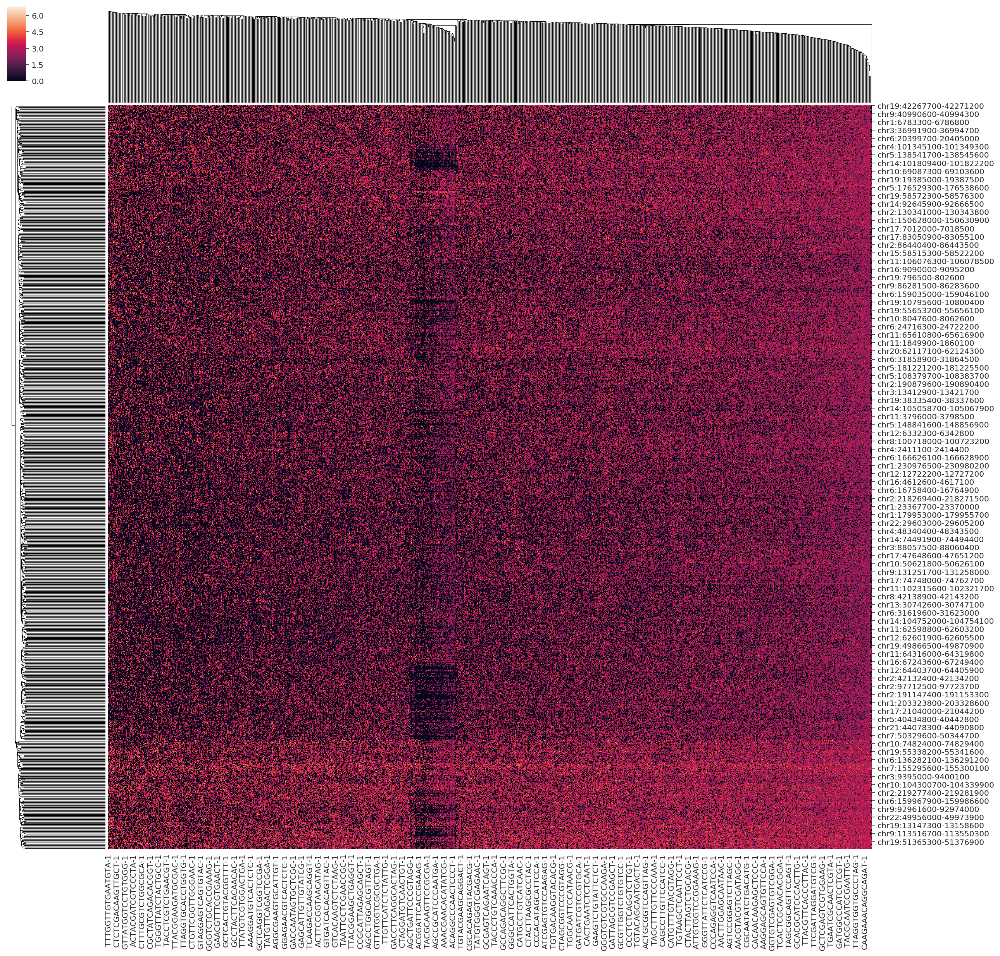

In [16]:
t = normdf.loc[peaks_filter].T # Transpose to (barcodes x peaks) format

pn = 1000
print('Computing top variative peaks', pn)
p_vars = zip(t.columns.values, list(t.var()))
t_var = t[list(map(lambda p: p[0], sorted(p_vars, key=lambda p: p[1], reverse=True)[:pn]))]

n = 1000
print('Sampling', n, 'cells')
t_var = t_var.sample(n=n, axis = 0)

print('Clustermap')
sns.clustermap(t_var.T, col_cluster=True, row_cluster=True, figsize=(20, 20))
plt.show()

## PCA and SVD

In [13]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, MaxAbsScaler, MinMaxScaler

def pca(df):
    normalized = norm(df).T # Transpose to (barcodes x peaks) format

    print('Standard scaling')    
    scaler = StandardScaler()    
    scaled = scaler.fit_transform(normalized.values) # X : numpy array of shape (n_samples, n_features)
    normalized = pd.DataFrame(scaled, index=normalized.index, columns=normalized.columns)

    # Number of dimensions recommended by Cell Ranger ATAC-Seq algorithm
    print('PCA')
    pca = PCA(n_components=15)
    result = pca.fit_transform(normalized) # X : array-like, shape (n_samples, n_features)
    print('Explained variation', np.sum(pca.explained_variance_ratio_))
    return result

PCA on features peaks
normalize the data to "mean" cut site counts per barcode
log transform
Standard scaling
PCA
Explained variation 0.021745439727685417
PC vs RPMS values
normalize the data to "mean" cut site counts per barcode
log transform


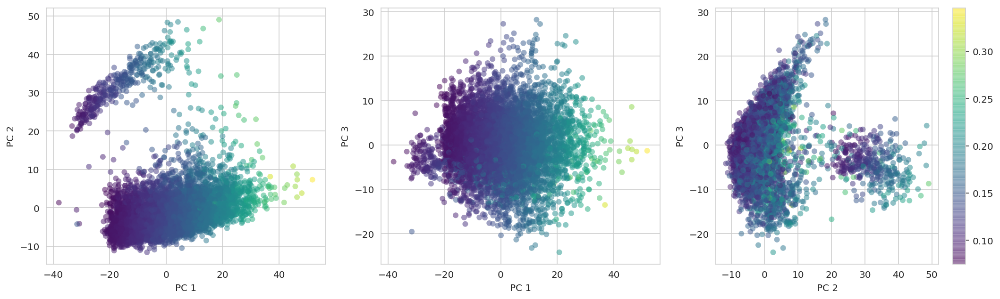

In [14]:
from collections import Counter
from sklearn.cluster import AgglomerativeClustering
    
print('PCA on features peaks')
result = pca(fulldf.loc[peaks_filter])

print('PC vs RPMS values')
plt.figure(figsize=(5, 5))
means = norm(fulldf).mean()
plt.subplots(nrows=1, ncols=3, figsize=(18, 5))
for i,(c1,c2) in enumerate([(0, 1), (0, 2), (1, 2)]):
    plt.subplot(1, 3, i + 1)
    plt.scatter(result[:, c1], result[:, c2], 
                c=means, cmap=plt.cm.viridis, 
                edgecolor='none', alpha=0.5)
    plt.xlabel('PC {}'.format(c1 + 1))
    plt.ylabel('PC {}'.format(c2 + 1))
plt.colorbar()
plt.show()

## Clustering

Clustering 5
Cluster 0 2486
Cluster 1 2802
Cluster 2 357
Cluster 3 1526
Cluster 4 388


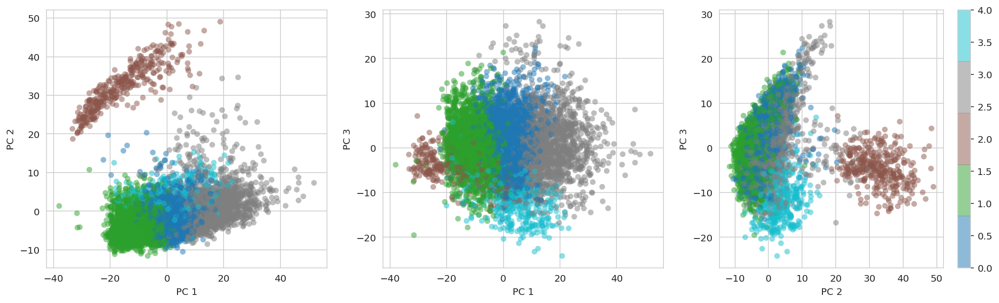

In [22]:
def clustering(result, n_clusters):
    # 2-10 clusters is recommened values by Cell Ranger ATAC-Seq
    # Ward method as default
    print('Clustering', n_clusters)
    clusters = AgglomerativeClustering(n_clusters=n_clusters).fit_predict(result)
    cluster_counter = Counter()
    for c in clusters:
        cluster_counter['Cluster {}'.format(c)] +=1
    for c, n in sorted(cluster_counter.items()):
        print(c, n)

    plt.subplots(nrows=1, ncols=3, figsize=(18, 5))
    for i,(c1,c2) in enumerate([(0, 1), (0, 2), (1, 2)]):
        plt.subplot(1, 3, i + 1)
        plt.scatter(result[:, c1], result[:, c2], 
                    c=clusters, cmap=plt.cm.get_cmap('tab10', n_clusters), 
                    edgecolor='none', alpha=0.5)
        plt.xlabel('PC {}'.format(c1 + 1))
        plt.ylabel('PC {}'.format(c2 + 1))
    plt.colorbar()
    plt.show()
    
    return clusters

n_clusters = 5
clusters = clustering(result, n_clusters)

## Heatmap on clusters built upon PCA

Sampling 200 cells from cluster
Processing cluster 0
Processing cluster 1
Processing cluster 2
Processing cluster 3
Processing cluster 4
Processing cluster 5
Processing cluster 6
Processing cluster 7
Computing top variative peaks 2000
Clustermap


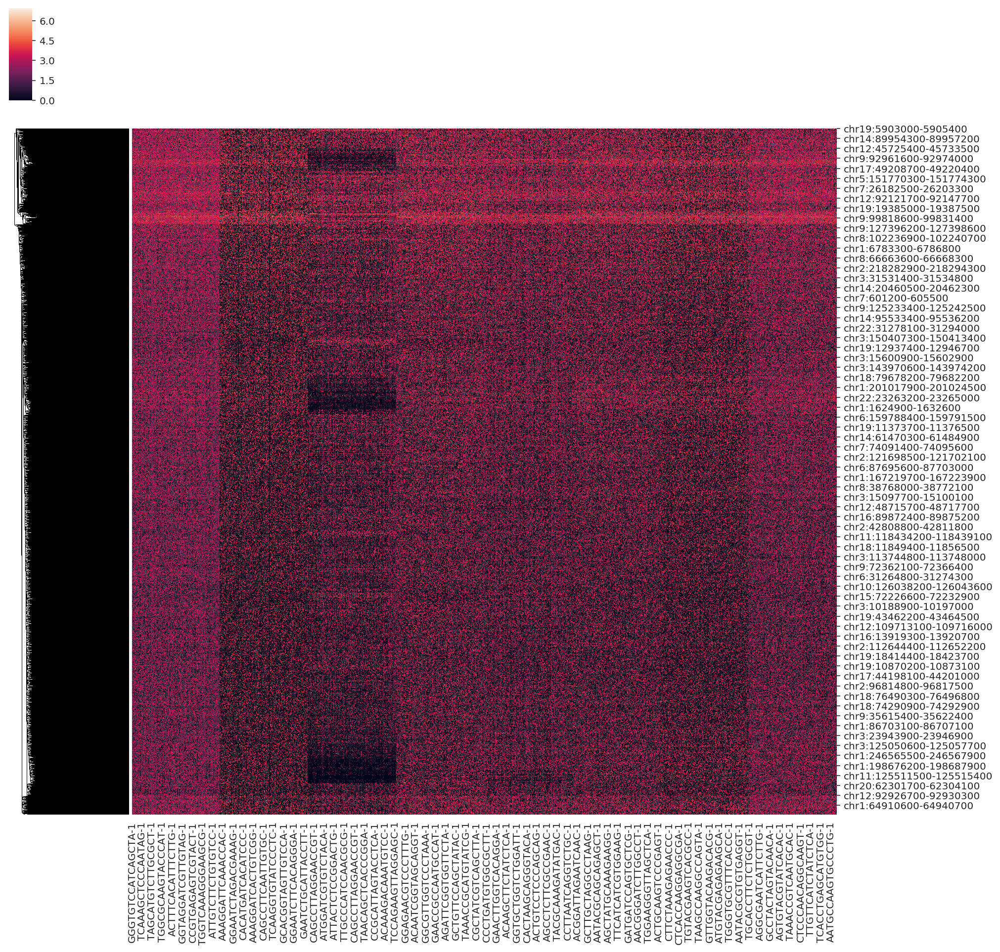

In [18]:
t = normdf.transpose() # Transpose to (barcodes x peaks) format
n = 200
print('Sampling', n, 'cells from cluster')
cluster_dfs = []
for cluster in range(n_clusters):
    print('Processing cluster', cluster)
    cluster_df = t.loc[clusters == cluster].sample(n=n, axis=0, replace=True)
    cluster_dfs.append(cluster_df)
t = pd.concat(cluster_dfs)

pn = 2000
print('Computing top variative peaks', pn)
p_vars = zip(t.columns.values, list(t.var()))
t_var = t[list(map(lambda p: p[0], sorted(p_vars, key=lambda p: p[1], reverse=True)[:pn]))]

print('Clustermap')
sns.clustermap(t_var.T, col_cluster=False, row_cluster=True, figsize=(15, 15))
plt.show()

## t-SNE

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 7559 samples in 0.011s...
[t-SNE] Computed neighbors for 7559 samples in 1.168s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7559
[t-SNE] Computed conditional probabilities for sample 2000 / 7559
[t-SNE] Computed conditional probabilities for sample 3000 / 7559
[t-SNE] Computed conditional probabilities for sample 4000 / 7559
[t-SNE] Computed conditional probabilities for sample 5000 / 7559
[t-SNE] Computed conditional probabilities for sample 6000 / 7559
[t-SNE] Computed conditional probabilities for sample 7000 / 7559
[t-SNE] Computed conditional probabilities for sample 7559 / 7559
[t-SNE] Mean sigma: 3.842381
[t-SNE] KL divergence after 250 iterations with early exaggeration: 87.622467
[t-SNE] Error after 1000 iterations: 2.358749
t-SNE done! Time elapsed


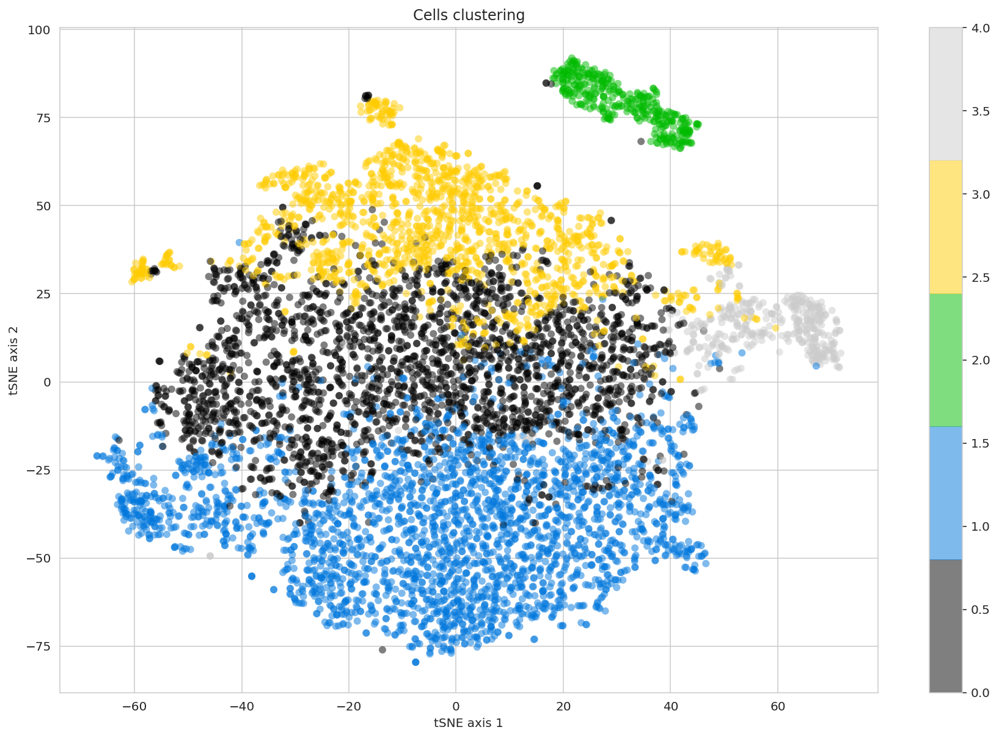

In [23]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, verbose=1)
tsne_results = tsne.fit_transform(result)
print('t-SNE done! Time elapsed')

# TSNE based visualizations
plt.figure(figsize=(15, 10))
sc = plt.scatter(tsne_results[:,0], tsne_results[:,1], 
            c=clusters, cmap=plt.cm.get_cmap('nipy_spectral', n_clusters),
            edgecolor='none', alpha=0.5)
plt.colorbar(sc)
plt.title('Cells clustering')
plt.xlabel('tSNE axis 1')
plt.ylabel('tSNE axis 2')
plt.show()

# Differential peaks a.k.a. Markers computation

Use statistical testing of mean in cluster vs others with multiple correction.

In [24]:
from scipy.stats import ttest_ind
from statsmodels.sandbox.stats.multicomp import multipletests

# T-test is not 100% applicable here, Mann Whitney U is correct.
# However, number of reads is quite big in each cluster and it can be used as an approximation.
def ttest(x, y):
    try:
        return ttest_ind(x, y).pvalue
    except ValueError:
        return 1.0

t = normdf.loc[peaks_filter].T # Transpose to (barcodes x peaks) format

fdr = 0.01

columns = ['cluster', 'peak', 'x', 'others', 'logfc', 'pval', 'adjusted_pval']
rows = []

# Per cluster mean normalized values
clusters_means = [t.loc[clusters == c].mean() for c in range(n_clusters)]

for cluster in range(n_clusters):
    print('Processing cluster', cluster)
    xs = t.loc[clusters == cluster]
    others_xs = t.loc[clusters != cluster]
    print('Testing')
    pvals = np.array([ttest(xs[c], others_xs[c]) for c in t.columns])  
    print('BH Multiple testing correction')
    res = multipletests(pvals, fdr, "fdr_bh")
    passed = res[0]
    print('Passed with FDR', fdr, sum(passed))
    adjusted = res[1]
    rows_cluster = []
    for i in range(len(adjusted)):
        if passed[i]:
            peak = t.columns[i]
            x = xs[peak].mean()
            others = others_xs[peak].mean()
            logfc = np.log((x + 1e-10)  /  (others + 1e-10))
            # Filter out only single side results, ugly, I know
            # HACK: pick only for cluster with max mean RPM value
            if logfc > 0 and cluster == np.argmax([clusters_means[c][i] for c in range(n_clusters)]):
                row = [cluster, peak, x, others, logfc, pvals[i], adjusted[i]] 
                rows_cluster.append(dict(zip(columns, row)))
    print('Corrected max mean value', len(rows_cluster))
    rows.extend(rows_cluster)

markers = pd.DataFrame(rows)
# Reorder columns
markers = markers[columns]
print('Done')
print('Total markers', len(markers))
markers.head()

Processing cluster 0
Testing
BH Multiple testing correction
Passed with FDR 0.01 2278
Corrected max mean value 11
Processing cluster 1
Testing
BH Multiple testing correction
Passed with FDR 0.01 17157
Corrected max mean value 0
Processing cluster 2
Testing
BH Multiple testing correction
Passed with FDR 0.01 10467
Corrected max mean value 1340
Processing cluster 3
Testing
BH Multiple testing correction
Passed with FDR 0.01 17807
Corrected max mean value 14615
Processing cluster 4
Testing
BH Multiple testing correction
Passed with FDR 0.01 3369
Corrected max mean value 1644
Done
Total markers 17610


In [44]:
top = 50
print('Analysing top', top, 'markers')

top_markers = pd.concat([
    markers.loc[markers['cluster'] == c].sort_values(['logfc'], ascending=False).head(top) for c in range(0, n_clusters)])
    
print('Top fold change markers saved to markers.bed')
with open('markers.bed', 'w') as f:
    for t in ([re.split(':|-', p) for p in top_markers['peak']]):
        f.write('{}\t{}\t{}\n'.format(*t))

top_markers.head()

Analysing top 50 markers
Top fold change markers saved to markers.bed


,cluster,peak,x,others,logfc,pval,adjusted_pval
6,0,chr4:168816400-168817300,0.419629,0.280052,0.404394,4.151487e-10,8.198046e-08
8,0,chr5:76624700-76627400,0.344696,0.234157,0.386673,4.761701e-08,4.299888e-06
0,0,chr14:100393200-100394700,0.312068,0.214626,0.374325,4.843415e-07,2.789620e-05
3,0,chr20:18737800-18740300,0.388512,0.267488,0.373251,3.095953e-08,2.975095e-06
9,0,chr9:70389600-70394000,0.255076,0.184787,0.322356,6.554654e-05,1.187370e-03


# Heatmap on top markers

Sampling 50 cells from cluster
Processing cluster 0
Processing cluster 1
Processing cluster 2
Processing cluster 3
Processing cluster 4
Processing top markers
Clustermap


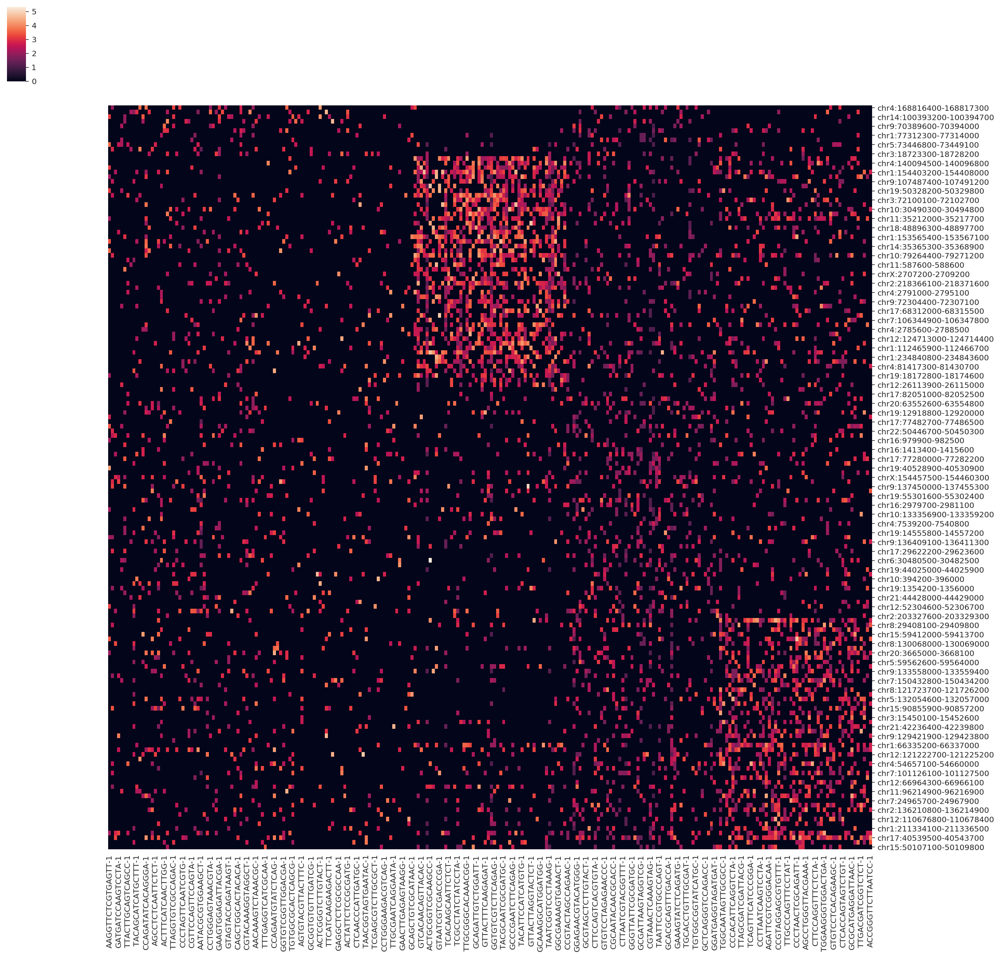

In [75]:
t = normdf.loc[peaks_filter].T # Transpose to (barcodes x peaks) format

n = 50
print('Sampling', n, 'cells from cluster')
cluster_dfs = []
for cluster in range(n_clusters):
    print('Processing cluster', cluster)
    cluster_df = t.loc[clusters == cluster].sample(n=n, axis=0, replace=True)
    cluster_dfs.append(cluster_df)
t = pd.concat(cluster_dfs)

print('Processing top markers')
t = t[list(top_markers['peak'])]

print('Clustermap')
sns.clustermap(t.T, col_cluster=False, row_cluster=False, figsize=(20, 20))
plt.show()

t-SNE based visualizations for markers


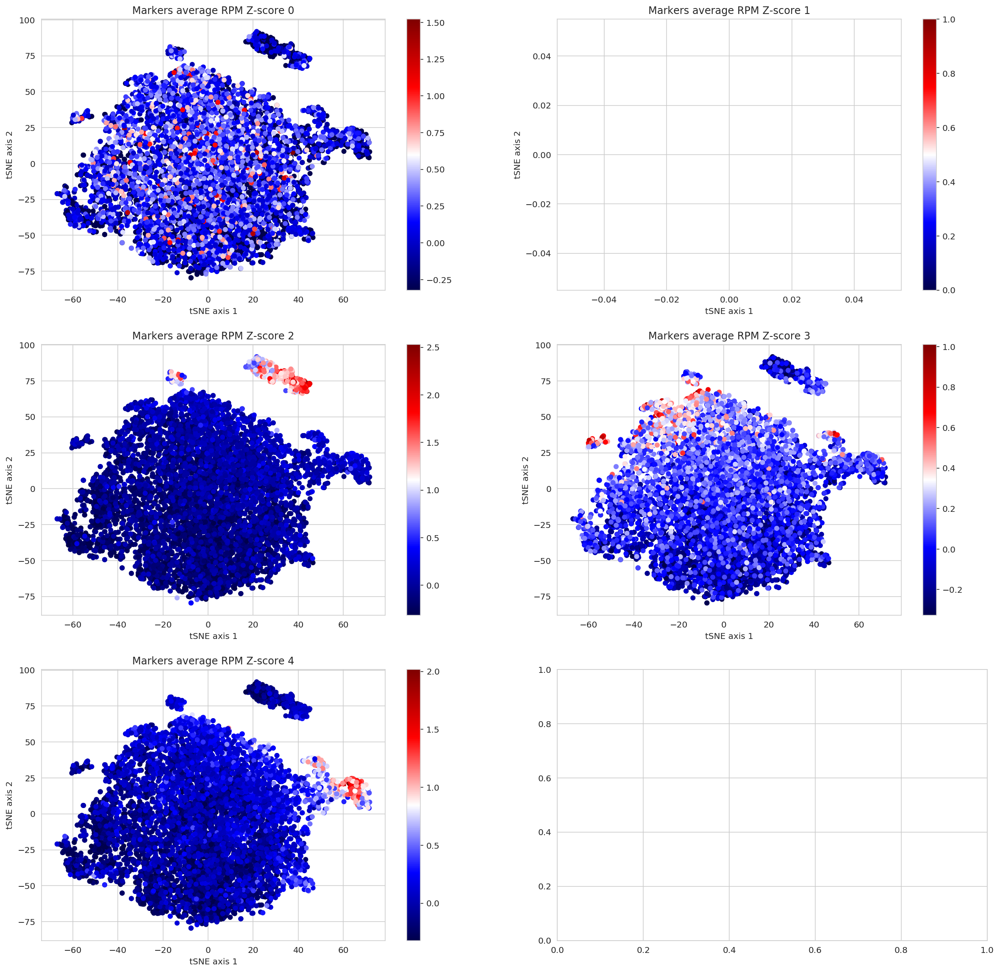

In [77]:
from scipy.stats import zscore
import math 

print('t-SNE based visualizations for markers')
ncols = 2
nrows = math.ceil(n_clusters / ncols)

t = normdf.loc[peaks_filter]

plt.subplots(nrows=nrows, ncols=ncols, figsize=(10 * ncols, 10 * ncols))
for cluster in range(n_clusters):
    ax = plt.subplot(nrows, ncols, cluster + 1)
    # Table (marker for cluster x cells)
    markers_df = t.loc[top_markers.loc[top_markers['cluster'] == cluster]['peak']]
    markers_df = markers_df.transpose()
    # Z scale for each peak across all cells
    for c in markers_df.columns:
        markers_df[c] = zscore(markers_df[c])
    
    # Average Z score for each cell
    zscores = list(markers_df.transpose().mean())
    positives = [z > 0 for z in zscores]
    negatives = [z <= 0 for z in zscores]
    t0 = list(tsne_results[negatives,0]) + list(tsne_results[positives,0])
    t1 = list(tsne_results[negatives,1]) + list(tsne_results[positives,1])
    zs = list(filter(lambda z: z <= 0, zscores)) + list(filter(lambda z: z > 0, zscores))
    sc = ax.scatter(t0, t1,
                c=zs, cmap=plt.cm.seismic,
                edgecolor='none')
    plt.colorbar(sc)
    plt.title('Markers average RPM Z-score {}'.format(cluster))
    plt.xlabel('tSNE axis 1')
    plt.ylabel('tSNE axis 2')
plt.show()

# BED files for clusters to visualize in JBR Genome Browser

We don't perform any filtration here, just store mean count per peak in cluster as score field in BED format. JBR allows user to filter BED tracks by score if nescessary.

Code for bed to bigbed conversion
```
for F in *cluster*.bed; do 
    echo $F; sort -k1,1 -k2,2n $F | sed 's/ /_/g'  > ${F}.sorted; 
    bedToBigBed ${F}.sorted /mnt/stripe/bio/genomes/hg38/hg38.chrom.sizes ${F/.bed/.bigBed} -type=bed6+; 
    rm ${F}.sorted; 
done
```

In [ ]:
import os
import glob

print('Cleanup peaks_clusters')
for f in glob.glob('./cluster_*.bed'):
    os.remove(f)

t = normdf.T # Transpose to (barcodes x peaks) format

print('BED scoring as mean')
# Same scale for all tracks
mean_max = t.mean().max()
print('Max of mean normalizer', mean_max)
# Per cluster mean values
clusters_means = [t.loc[clusters == c].mean() for c in range(n_clusters)]

for cluster in range(n_clusters):
    xs_means = t.loc[clusters == cluster].mean()
    xs_sds = np.sqrt(t.loc[clusters == cluster].var())
    bed_file = 'cluster_{}.bed'.format(cluster)
    print('Writing cluster', cluster, 'peaks to', bed_file)
    with open(bed_file, 'w') as bed:
        for i in range(len(xs_means)):
            peak = xs_means.index[i]
            mean = xs_means[i]
            sd = xs_sds[i]
            bed.write('{}\t{}\t{}\t{}\n'.format(
                re.sub(':|-', '\t', peak), 
                '{} mean {:3.2f} sd {:3.2f}'.format(
                    '*' if cluster == np.argmax([clusters_means[c][i] for c in range(n_clusters)]) else '', 
                    mean, sd), 
                min(1000, int(mean * 1000 / mean_max)), 
                '.'))
print('Done')                

# Differential clusters to BED for downstream analysis

Code for bed to bigbed conversion
```
for F in *cluster*.bed; do 
    echo $F; sort -k1,1 -k2,2n $F | sed 's/ /_/g'  > ${F}.sorted; 
    bedToBigBed ${F}.sorted /mnt/stripe/bio/genomes/hg38/hg38.chrom.sizes ${F/.bed/.bigBed} -type=bed6+; 
    rm ${F}.sorted; 
done
```

In [61]:
print('Cleanup peaks_clusters')
for f in glob.glob('./diff_cluster_*.bed'):
    os.remove(f)

mlap_max = (-np.log10(markers.loc[markers['adjusted_pval'] != 0]['adjusted_pval'])).max()
print('BED scoring as -log10 adjusted pval')
print('Max of -log10 adjusted pval', mlap_max)
for c in range(n_clusters):
    bed_file = 'diff_cluster_{}.bed'.format(c)
    markers_cluster = markers.loc[markers['cluster'] == c].sort_values(['logfc'], ascending=False).iloc[::-1]
    markers_cluster.index = range(len(markers_cluster))
    print('Writing cluster', c, 'differential peaks to', bed_file)
    with open(bed_file, 'w') as bed:
        for i in range(len(markers_cluster)):
            peak = markers_cluster['peak'][i]
            ap = markers_cluster['adjusted_pval'][i]
            mlap = -np.log10(ap) if ap != 0.0 else mlap_max
            bed.write('{}\t{}\t{}\t.\n'.format(
                re.sub(':|-', '\t', peak), 
                cluster,
                int(mlap * 1000 / mlap_max)))
print('Done')                

Cleanup peaks_clusters
BED scoring as -log10 adjusted pval
Max of -log10 adjusted pval 281.8946321169962
Writing cluster 0 differential peaks to diff_cluster_0.bed
Writing cluster 1 differential peaks to diff_cluster_1.bed
Writing cluster 2 differential peaks to diff_cluster_2.bed
Writing cluster 3 differential peaks to diff_cluster_3.bed
Writing cluster 4 differential peaks to diff_cluster_4.bed
Done


# Genes annotating

In [62]:
# Preprocess Genes GTF
GTF_TO_BED_SH = """
GENES_GTF=$1
GENES_BED=$2
GENE_NAME_FIELD=$(cat ${GENES_GTF} | grep -v '#' | head -n 1 | awk '{for (i=1; i<NF; i++) {if ($i=="gene_name") print (i+1)}}')
cat ${GENES_GTF} |  awk -v GN=${GENE_NAME_FIELD} 'OFS="\t" {if ($3=="gene") {print $1,$4-1,$5,$GN}}' | tr -d '";' |\
    sort -k1,1 -k2,2n | sed 's/^/chr/g' > ${GENES_BED}
"""

genes_gtf = 'Homo_sapiens.GRCh38.90.gtf'
genes_bed = genes_gtf + '.bed'
if not os.path.exists(genes_bed):
    print('Downloading genes bed file')
    ! wget ftp://ftp.ensembl.org/pub/release-90/gtf/homo_sapiens/Homo_sapiens.GRCh38.90.gtf.gz
    ! gunzip -f Homo_sapiens.GRCh38.90.gtf.gz
    with tempfile.NamedTemporaryFile(prefix='', suffix='.sh', delete=False) as f:
        f.write(GTF_TO_BED_SH.encode('utf-8'))
        f.close()
        ! bash {f.name} {genes_gtf} {genes_bed} 
    os.remove(genes_gtf)
print('Genes bed file', genes_bed)   
! head Homo_sapiens.GRCh38.90.gtf.bed

Genes bed file Homo_sapiens.GRCh38.90.gtf.bed
chr1	11868	14409	DDX11L1
chr1	14403	29570	WASH7P
chr1	17368	17436	MIR6859-1
chr1	29553	31109	MIR1302-2HG
chr1	30365	30503	MIR1302-2
chr1	34553	36081	FAM138A
chr1	52472	53312	AL627309.6
chr1	57597	64116	OR4G11P
chr1	65418	71585	OR4F5
chr1	89294	133723	AL627309.1


In [63]:
print('Annotating markers with closest genes')
with tempfile.NamedTemporaryFile(delete=False) as f:
    # Save index to restore original order after sorting
    for i, t in enumerate([re.split(':|-', p) for p in markers['peak']]):
        f.write('{}\t{}\t{}\t{}\n'.format(*t, i).encode('utf-8'))
    f.close()
    closest_file = f.name + '.closest'
    sorted_file = f.name + '.sorted'
    ! sort -k1,1 -k2,2n {f.name} > {sorted_file}
    ! bedtools closest -a {sorted_file} -b {genes_bed} -D ref > {closest_file}
    closest_df = pd.read_csv(
        closest_file, sep='\t', 
        names=['peak_chr', 'peak_start', 'peak_end', 'index', 'gene_chr', 'gene_start', 'gene_end', 'gene', 'distance'])
    # Restore original sorting as 
    closest_df.sort_values(by=['index'], inplace=True)
    # Pick only first closest gene in case of several
    closest_df.drop_duplicates(['index'], inplace=True)
    # Use list to disable index
    markers['gene'] = list(closest_df['gene'])
    markers['distance'] = list(closest_df['distance'])

markers.head()

Annotating markers with closest genes


,cluster,peak,x,others,logfc,pval,adjusted_pval,gene,distance
0,0,chr14:100393200-100394700,0.312068,0.214626,0.374325,4.843415e-07,0.000028,WDR25,0
1,0,chr14:74867100-74868200,0.272168,0.199835,0.308928,1.041256e-04,0.001667,PROX2,0
2,0,chr1:77312300-77314000,0.264401,0.193278,0.313338,9.447429e-05,0.001555,AK5,0
3,0,chr20:18737800-18740300,0.388512,0.267488,0.373251,3.095953e-08,0.000003,DTD1,0
4,0,chr20:41046800-41049700,0.258173,0.187223,0.321331,5.299539e-05,0.001013,TOP1,0


# Preparation data for single cell explorer
Preprocess data for single cell explorer http://artyomovlab.wustl.edu/shiny/single_cell_explorer

In [64]:
from scipy import io, sparse

print('Save data_for_plot.tsv')
barcodes = normdf.transpose().index.values
data_for_plot = pd.DataFrame(
    {'tSNE_1': tsne_results[:,0], 
     'tSNE_2': tsne_results[:,1], 
     'Cluster': clusters,
     'nCounts': fulldf.sum()})
data_for_plot.index = barcodes
data_for_plot.to_csv('data_for_plot.tsv', sep='\t')

print('Save RPM expData.Rda.mtx')
csc = sparse.csc_matrix(normdf.values)
io.mmwrite('expData.Rda.mtx', csc)

print('Save barcodes.txt')
with open('barcodes.txt', 'w') as f:
    for b in normdf.columns.values:
        f.write(b + '\n')

print('Save peaks.txt')
with open('peaks.txt', 'w') as f:
    for p in normdf.index.values:
        f.write(p + '\n')

print('Save markers.tsv')
top_markers.to_csv('markers.tsv', index=None, sep='\t')
        
print('Done')

Save data_for_plot.tsv
Save RPM expData.Rda.mtx
Save barcodes.txt
Save peaks.txt
Save markers.tsv
Done


In [65]:
print('Converting to Rda format in R')

R_CODE = """
require(readr)
require(Matrix)
library(magrittr)

barcodes <- readr::read_tsv('barcodes.txt', col_names = F)
peaks <- readr::read_tsv('peaks.txt', col_names = F)
expData <- Matrix::readMM('expData.Rda.mtx') %>%
    magrittr::set_rownames(peaks$X1) %>%
    magrittr::set_colnames(barcodes$X1)
save(expData, file = "expData.Rda")
"""

with tempfile.NamedTemporaryFile(prefix='prepare', suffix='.R', delete=False) as f:
    f.write(R_CODE.encode('utf-8'))
    f.close()
    ! Rscript {f.name}

print('Upload `data_for_plot.tsv` and `expData.Rda` to corresponding folder and voila!')

Converting to Rda format in R
During startup - Warning message:
package ‘RevoUtils’ was built under R version 3.4.3 
Loading required package: readr
Warning message:
package ‘readr’ was built under R version 3.4.3 
Loading required package: Matrix
Warning message:
package ‘Matrix’ was built under R version 3.4.3 
Parsed with column specification:
cols(
  X1 = col_character()
)
Parsed with column specification:
cols(
  X1 = col_character()
)
Upload `data_for_plot.tsv` and `expData.Rda` to corresponding folder and voila!


# Associated genes analysis

In [78]:
print('Top markers genes')
top = 50
for cluster in range(n_clusters):
    print('Cluster', cluster)
    cluster_top = markers.loc[markers['cluster'] == cluster].sort_values(['logfc'], ascending=False).head(top)
    print(', '.join(set(cluster_top['gene'])))
    print('---')
    print(', '.join(cluster_top['peak']))
    print('---')

Top markers genes
Cluster 0
PROX2, TOP1, AK5, IQGAP2, SATB1-AS1, PALLD, FOXD1-AS1, KLF9, RAB39B, WDR25, DTD1
---
chr4:168816400-168817300, chr5:76624700-76627400, chr14:100393200-100394700, chr20:18737800-18740300, chr9:70389600-70394000, chr20:41046800-41049700, chr1:77312300-77314000, chr14:74867100-74868200, chr5:73446800-73449100, chrX:155263000-155264800, chr3:18723300-18728200
---
Cluster 1

---

---
Cluster 2
HPS3, S100A2, IFI30, RNY4P16, SMAD7, CACNA2D4, MIR4645, CD99, CUEDC1, KCNC3, ARSG, OAT, LINC01732, RFX2, LINC01588, BHLHE41, SH3BP2, WNT2B, PLEC, HNRNPA1P32, AC073593.1, ITGAX, TRIQK, P4HA2, CTSZ, ZMIZ1, MAML3, AL162591.1, LINC00877, CD44-AS1, PHRF1, AL360294.1, RN7SL636P, ZNF365, LINC02356, BIN1, MTA3, AL109615.3, LINC01504, AL133163.2, TTC7A, KLF4, CATIP, AC004917.1, RASGEF1B, AC098613.1, P2RY6
---
chr2:47069600-47074500, chr4:140094500-140096800, chr4:2797400-2801700, chr1:154403200-154408000, chr10:124340900-124342500, chr9:107487400-107491200, chr11:73288300-73289900, 

In [70]:
# Based on Peter Tsurinov markers list 
# https://docs.google.com/spreadsheets/d/1UZllYrMXBFRmtqGrcFhjI4CKhe4xhlnD-KTcXjwPrrs/edit#gid=448526880
MARKERS_TABLE = {
    'B cells': ['CD19', 'MS4A1', 'PTPRC', 'CD24', 'CD38', 'CD22', 'BCR'],
    'Plasma B cells': ['JCHAIN'],
    'NK cells': [ 'NCAM1', 'KLRD1', 'NCR1', 'FCGR3A', 'GNLY', 'NKG7', 'PECAM1', 'TNFRSF8', 'CD38', 
                 'CD3D', 'B3GAT1', 'IGF1R', 'NCR2', 'NCR3'],
    'Stem Cell/Precursor': [ 'CD34', 'THY1', 'PECAM1', 'KIT'],
    'Dendritic cells': [ 'ITGAX', 'HLA-DRA', 'CD1C', 'CD83', 
                    'THBD', 'CD209', 'IL3RA', 'FCER1A', 'CST3', 'CLEC7A', 'CLEC9A', 'CLEC10A', 
                        'TLR10', 'CR2', 'KEL', 'NGFR'],
    'Plasmacytoid Dendritic cells': [ 'IL3RA', 'CLEC4C', 'NRP1', 'LILRA4', 'PVRL1', 'CLEC4C', 'TLR7'],
    'CD14+ Monocyte': [ 'CD14', 'FCGR1A', 'CD33', 'LYZ', 'CD4', 'PTPRC', 'CSF3R', 'ITGAL', 'LRP1', 'SELPLG', 'MST1R'],
    'Macrophage': [ 'ITGAM', 'CD68', 'CD163', 'FCGR3A', 'MS4A7', 'CD3D', 'ITGAD', 'ITGAV', 
                   'MST1R', 'MRC2', 'VEGFA', 'VEGFB', 'VEGFC'],
    'Naive T Cells': [ 'CCR7', 'SELL'],
    'Activated T Cells': [ 'IL2RA', 'AIM1', 'LMNA'],
    'CD4 cells (T cell subtype)': [ 'CD3D', 'NCAM1', 'CD4', 'IL7R', 'SELL', 'ITGB1', 'PTPRC'], 
    'CD8 cells (T cell subtype)': [ 'CD3D', 'NCAM1', 'CD8A', 'CD8B', 'PTPRC'],
    'CD8 activated cells (T cell subtype)': [ 'CCL5'],
    'T regulatory cells (T cell subtype)': [ 'CD3D', 'NCAM1', 'FOXP3', 'IL2RA', 'CD4'],
    'Mucosal-associated invariant T cells (MAIT)': [ 'SLC4A10', 'ZBTB16', 'RORC'],
    'Megakaryocyte': [ 'PPBP', 'GP9', 'CD177', 'ITGA2B', 'GP1BA'],
    'Platelet': [ 'ITGA2B', 'ITGB3', 'PTPRC', 'GP1BA', 'SELP', 'CEACAM8', 'PTPRC', 'ITGAM', 'CD24', 'CSF3R', 'CXCR2'],
    'Mast cells (Granulocyte subtype)': [ 'FCGR2A', 'CD33', 'KIT', 'ENPP3', 
                                     'FCER1A', 'KIT', 'CEACAM8', 'PTPRC', 'ITGAM', 'CD24', 'CSF3R', 'CXCR2'],
    'Basophil (Granulocyte subtype)': [ 'CD19', 'CD22', 'IL3RA', 'ENPP3', 
                                   'FCER1A', 'ITGAM', 'CEACAM8', 'PTPRC', 'ITGAM', 'CD24', 'CSF3R', 'CXCR2'],
    'Eosinophil (Granulocyte subtype)': [ 'PTPRC', 'IL5RA', 'CCR3', 'ADGRE1', 
                                     'SIGLEC8', 'CD55', 'ITGA4', 'CEACAM8', 'PTPRC', 'ITGAM', 'CD24', 'CSF3R', 'CXCR2'],
    'Neutrophil (Granulocyte subtype)': [ 'ITGAM', 'FCGR3A', 'ITGB2', 'FCGR2A', 'CD44'],
    'Erythrocyte (Red blood cells)': [ 'GYPA', 'RRM2', 'TYMS'],
    'Plasma Cells': [ 'SDC1'],
    'Epithelial Cells': [ 'EPCAM', 'DDR2', 'MTF1'],
    'Endothelial Cells': [ 'MCAM', 'ALK', 'CD202b']
}

In [71]:
from collections import Counter

for cluster in range(n_clusters):
    print('Processing cluster', cluster)
    markers_cluster = markers.loc[markers['cluster'] == cluster]
    counter = Counter()
    genes = set(markers_cluster['gene'])
    detected = []
    for gene in genes:
        for k, v in MARKERS_TABLE.items():
            if gene in v:
                counter[k] += 1
                detected.append(gene)
    for k, v in counter.items():
        print(k, v)
    print('Detected genes', ', '.join(set(detected)))
    print('Total genes', len(genes))
    print('---')

Processing cluster 0
Detected genes 
Total genes 11
---
Processing cluster 1
Detected genes 
Total genes 0
---
Processing cluster 2
CD14+ Monocyte 1
B cells 1
Dendritic cells 2
Activated T Cells 1
Basophil (Granulocyte subtype) 1
Macrophage 1
NK cells 1
Detected genes CD14, TNFRSF8, CD19, ITGAV, CD83, ITGAX, LMNA
Total genes 1200
---
Processing cluster 3
Erythrocyte (Red blood cells) 1
Mucosal-associated invariant T cells (MAIT) 1
Endothelial Cells 2
T regulatory cells (T cell subtype) 1
Eosinophil (Granulocyte subtype) 5
Platelet 3
Basophil (Granulocyte subtype) 2
Megakaryocyte 2
CD4 cells (T cell subtype) 1
CD14+ Monocyte 4
Mast cells (Granulocyte subtype) 2
Stem Cell/Precursor 1
CD8 cells (T cell subtype) 2
B cells 3
Dendritic cells 3
CD8 activated cells (T cell subtype) 1
Epithelial Cells 1
Activated T Cells 1
Macrophage 1
NK cells 9
Detected genes LRP1, CD55, CD38, IGF1R, GP9, CXCR2, MST1R, RRM2, ALK, CD83, NCR3, ZBTB16, B3GAT1, KLRD1, IL2RA, TNFRSF8, NCR2, NCR1, MTF1, CD8A, CCL5,